<a href="https://colab.research.google.com/github/federicotarozzi/Corso_AnalistaProgrammatoreDatiGeoSpaziali/blob/main/NDVI_timeseries.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Field NDVI's timeseries analysis notebook

#### Import the library we need

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from datetime import datetime

#### Datasets upload

In [ ]:
#Piacenza data
NDVI_pc_2019 = pd.read_csv('Data/NDVI_data/NDVI_50_pc_2019.csv')
NDVI_pc_2020 = pd.read_csv('Data/NDVI_data/NDVI_50_pc_2020.csv')
NDVI_pc_2021 = pd.read_csv('Data/NDVI_data/NDVI_50_pc_2021.csv')
NDVI_pc_2022 = pd.read_csv('Data/NDVI_data/NDVI_50_pc_2022.csv')
NDVI_pc_2023 = pd.read_csv('Data/NDVI_data/NDVI_50_pc_2023.csv')
#Ravenna data
NDVI_ra_2020 = pd.read_csv('Data/NDVI_data/NDVI_50_ra_2020.csv')
NDVI_ra_2021 = pd.read_csv('Data/NDVI_data/NDVI_50_ra_2021.csv')
NDVI_ra_2022 = pd.read_csv('Data/NDVI_data/NDVI_50_ra_2022.csv')
NDVI_ra_2023 = pd.read_csv('Data/NDVI_data/NDVI_50_ra_2023.csv')

In [ ]:
# have a look at the dataset
NDVI_pc_2019

,Polygon_ID,Coordinates,Date,Mean_NDVI_per_pixel,Median_NDVI_per_pixel,Year,Province
0,1,"POLYGON ((535640.5821450471 4988226.426166232,...",04-02-2019,NaN,NaN,2019,Piacenza
1,1,"POLYGON ((535640.5821450471 4988226.426166232,...",04-04-2019,NaN,NaN,2019,Piacenza
2,1,"POLYGON ((535640.5821450471 4988226.426166232,...",04-07-2019,NaN,NaN,2019,Piacenza
3,1,"POLYGON ((535640.5821450471 4988226.426166232,...",04-09-2019,NaN,NaN,2019,Piacenza
4,1,"POLYGON ((535640.5821450471 4988226.426166232,...",04-12-2019,NaN,NaN,2019,Piacenza
...,...,...,...,...,...,...,...
3545,50,"POLYGON ((549300.5655790321 4987624.857265394,...",09-19-2019,NaN,NaN,2019,Piacenza
3546,50,"POLYGON ((549300.5655790321 4987624.857265394,...",09-21-2019,NaN,NaN,2019,Piacenza
3547,50,"POLYGON ((549300.5655790321 4987624.857265394,...",09-24-2019,0.075130,0.0719,2019,Piacenza
3548,50,"POLYGON ((549300.5655790321 4987624.857265394,...",09-26-2019,NaN,NaN,2019,Piacenza


____________________________________________________________________________________________________________________________________________

#### Data cleaning and preparation
- A bit of tidying and organization
- Elimination of fields with little information
- Interpolation of missing data
- Transformation from date to days of growing
- Normalization

In [ ]:
# change date method and define Year column
NDVI_list = [NDVI_pc_2019, NDVI_pc_2020, NDVI_pc_2021, NDVI_pc_2022, NDVI_pc_2023, NDVI_ra_2020, NDVI_ra_2021, NDVI_ra_2022, NDVI_ra_2023]

for NDVI in NDVI_list:
    NDVI['Date'] = pd.to_datetime(NDVI['Date'])
    NDVI['Date'] = NDVI['Date'].dt.strftime('%m-%d-%Y')
    NDVI['Year'] = NDVI['Date'].str.slice(6, 10)

In [ ]:
# define Province column
NDVI_piacenza = [NDVI_pc_2019, NDVI_pc_2020, NDVI_pc_2021, NDVI_pc_2022, NDVI_pc_2023]

for NDVI in NDVI_piacenza:
    NDVI['Province'] = 'Piacenza'

NDVI_ravenna = [NDVI_ra_2020, NDVI_ra_2021, NDVI_ra_2022, NDVI_ra_2023]

for NDVI in NDVI_ravenna:
    NDVI['Province'] = 'Ravenna'

In [ ]:
# Concat the datasets and drop useless columns

NDVI_list = [NDVI_pc_2019, NDVI_pc_2020, NDVI_pc_2021, NDVI_pc_2022, NDVI_pc_2023, # Piacenza datasets
             NDVI_ra_2020, NDVI_ra_2021, NDVI_ra_2022, NDVI_ra_2023] # Ravenna datasets
NDVI = pd.concat(NDVI_list, ignore_index=True)

NDVI = NDVI.drop(['Coordinates'], axis = 1)

In [ ]:
# create an univocal ID for every field based on field id, yiear and province (avoid same names)

NDVI['ID'] = NDVI['Polygon_ID'].astype(str) + '_' + NDVI['Year'].astype(str) + '_' + NDVI['Province']
NDVI

,Polygon_ID,Date,Mean_NDVI_per_pixel,Median_NDVI_per_pixel,Year,Province,ID
0,1,04-02-2019,NaN,NaN,2019,Piacenza,1_2019_Piacenza
1,1,04-04-2019,NaN,NaN,2019,Piacenza,1_2019_Piacenza
2,1,04-07-2019,NaN,NaN,2019,Piacenza,1_2019_Piacenza
3,1,04-09-2019,NaN,NaN,2019,Piacenza,1_2019_Piacenza
4,1,04-12-2019,NaN,NaN,2019,Piacenza,1_2019_Piacenza
...,...,...,...,...,...,...,...
30845,50,09-17-2023,NaN,NaN,2023,Ravenna,50_2023_Ravenna
30846,50,09-20-2023,NaN,NaN,2023,Ravenna,50_2023_Ravenna
30847,50,09-22-2023,NaN,NaN,2023,Ravenna,50_2023_Ravenna
30848,50,09-25-2023,NaN,NaN,2023,Ravenna,50_2023_Ravenna


#### • Elimination of polytons with little data

In [ ]:
#percentages of dates that do not have NaN values
treshold = 65

# NaN value count
nan_counts = NDVI.groupby('ID')['Mean_NDVI_per_pixel'].apply(lambda x: x.isna().sum())

# Calculate the percentage of NaN values for each polygon
percent_nan = (nan_counts / (df.groupby('ID')['Date'].nunique())) * 100

# Select the polygons that have more than 65% NaN values and get the list of their names
poligoni_da_rimuovere = percent_nan[percent_nan > treshold].index.tolist()

# df selection
NDVI_fil = NDVI[~NDVI['ID'].isin(poligoni_da_rimuovere)]

In [ ]:
NDVI_fil

,Polygon_ID,Date,Mean_NDVI_per_pixel,Median_NDVI_per_pixel,Year,Province,ID
71,2,04-02-2019,0.400172,0.17940,2019,Piacenza,2_2019_Piacenza
72,2,04-04-2019,NaN,NaN,2019,Piacenza,2_2019_Piacenza
73,2,04-07-2019,NaN,NaN,2019,Piacenza,2_2019_Piacenza
74,2,04-09-2019,0.427005,0.18815,2019,Piacenza,2_2019_Piacenza
75,2,04-12-2019,NaN,NaN,2019,Piacenza,2_2019_Piacenza
...,...,...,...,...,...,...,...
30845,50,09-17-2023,NaN,NaN,2023,Ravenna,50_2023_Ravenna
30846,50,09-20-2023,NaN,NaN,2023,Ravenna,50_2023_Ravenna
30847,50,09-22-2023,NaN,NaN,2023,Ravenna,50_2023_Ravenna
30848,50,09-25-2023,NaN,NaN,2023,Ravenna,50_2023_Ravenna


In [ ]:
province = 'Piacenza'
year = '2022'

NDVI_count = NDVI_fil[(NDVI_fil['Province'] == province) & (NDVI_fil['Year'] == year)]
print(NDVI_count['ID'].unique())
print(NDVI_count['ID'].nunique())

['1_2022_Piacenza' '2_2022_Piacenza' '3_2022_Piacenza' '5_2022_Piacenza'
 '6_2022_Piacenza' '8_2022_Piacenza' '10_2022_Piacenza' '11_2022_Piacenza'
 '12_2022_Piacenza' '13_2022_Piacenza' '14_2022_Piacenza'
 '15_2022_Piacenza' '16_2022_Piacenza' '17_2022_Piacenza'
 '19_2022_Piacenza' '20_2022_Piacenza' '21_2022_Piacenza'
 '22_2022_Piacenza' '24_2022_Piacenza' '27_2022_Piacenza'
 '29_2022_Piacenza' '30_2022_Piacenza' '31_2022_Piacenza'
 '32_2022_Piacenza' '33_2022_Piacenza' '34_2022_Piacenza'
 '35_2022_Piacenza' '38_2022_Piacenza' '40_2022_Piacenza'
 '41_2022_Piacenza' '42_2022_Piacenza' '43_2022_Piacenza'
 '46_2022_Piacenza' '47_2022_Piacenza' '49_2022_Piacenza']
35


#### • Interpolation of NDVI values for all the data in the growing period

In [ ]:
# Ordine per data
NDVI_fil = NDVI_fil.sort_values(by=['ID', 'Date'])

# interpolazione
def interpolate_group(group):
    group['NDVI_ipotizzato'] = group['Mean_NDVI_per_pixel'].interpolate()
    return group

def interpolate_group_mediana(group_mediana):
    group_mediana['Median_ipotizzata'] = group_mediana['Median_NDVI_per_pixel'].interpolate()
    return group_mediana

# Applica l'interpolazione a tutti i poligoni
NDVI_fil = NDVI_fil.groupby('Polygon_ID').apply(interpolate_group).reset_index(drop=True)
NDVI_fil = NDVI_fil.groupby('Polygon_ID').apply(interpolate_group_mediana).reset_index(drop=True)
NDVI_fil.head(5)

,Polygon_ID,Date,Mean_NDVI_per_pixel,Median_NDVI_per_pixel,Year,Province,ID,NDVI_ipotizzato,Median_ipotizzata
0,10,04-02-2019,0.170877,0.1617,2019,Piacenza,10_2019_Piacenza,0.170877,0.161700
1,10,04-04-2019,NaN,NaN,2019,Piacenza,10_2019_Piacenza,0.161833,0.149367
2,10,04-07-2019,NaN,NaN,2019,Piacenza,10_2019_Piacenza,0.152789,0.137033
3,10,04-09-2019,0.143746,0.1247,2019,Piacenza,10_2019_Piacenza,0.143746,0.124700
4,10,04-12-2019,NaN,NaN,2019,Piacenza,10_2019_Piacenza,0.145252,0.128733


#### • Transformation from date to days of growing and normalization

In [ ]:
NDVI_fil['Days'] = 0
riferimento = 0.6 # soglia NDVI da cui partire

new = []

for poligono_id in NDVI_fil['ID'].unique():
    poligono = NDVI_fil[NDVI_fil['ID'] == poligono_id].copy()  # Crea una copia del DataFrame

    # Verifica se il valore di riferimento è raggiunto nel poligono
    if poligono['NDVI_ipotizzato'].max() >= riferimento:
        poligono.reset_index(inplace=True)

        # Definizione punto 1 (con la soglia di 0.6)
        giorno1 = poligono.loc[poligono['NDVI_ipotizzato'] >= riferimento].index.min()

        # Valori in days
        poligono.loc[poligono.index >= giorno1, 'Days'] = np.arange(1, 1 + len(poligono) - giorno1)
        poligono.loc[poligono.index < giorno1, 'Days'] = np.arange(- (len(poligono) - (len(poligono) - giorno1)), 0, 1)
        new.append(poligono)

# Concatena solo i poligoni che hanno raggiunto la soglia
if new:
    df = pd.concat(new)
else:
    df = pd.DataFrame()  # Creare un DataFrame vuoto se nessun poligono ha raggiunto la soglia

In [ ]:
df

,index,Polygon_ID,Date,Mean_NDVI_per_pixel,Median_NDVI_per_pixel,Year,Province,ID,NDVI_ipotizzato,Median_ipotizzata,Days
0,0,10,04-02-2019,0.170877,0.1617,2019,Piacenza,10_2019_Piacenza,0.170877,0.161700,-38
1,1,10,04-04-2019,NaN,NaN,2019,Piacenza,10_2019_Piacenza,0.161833,0.149367,-37
2,2,10,04-07-2019,NaN,NaN,2019,Piacenza,10_2019_Piacenza,0.152789,0.137033,-36
3,3,10,04-09-2019,0.143746,0.1247,2019,Piacenza,10_2019_Piacenza,0.143746,0.124700,-35
4,4,10,04-12-2019,NaN,NaN,2019,Piacenza,10_2019_Piacenza,0.145252,0.128733,-34
...,...,...,...,...,...,...,...,...,...,...,...
64,21052,9,09-17-2023,NaN,NaN,2023,Ravenna,9_2023_Ravenna,0.519364,0.529375,22
65,21053,9,09-20-2023,0.447312,0.4580,2023,Ravenna,9_2023_Ravenna,0.447312,0.458000,23
66,21054,9,09-22-2023,NaN,NaN,2023,Ravenna,9_2023_Ravenna,0.447312,0.458000,24
67,21055,9,09-25-2023,NaN,NaN,2023,Ravenna,9_2023_Ravenna,0.447312,0.458000,25


In [ ]:
# cut the days before and after the growing period
df_cut = df.loc[df['Days']>= -25]
df_tot = df_cut.loc[df_cut['Days']<= 40].reset_index(drop=True)

In [ ]:
# We will need a new dataset for the next notebook
df_tot.to_csv('Data/NDVI_total_data.csv', index=False)

_________________________________________________________________________________________________________________________________________________________________

### NDVI fields curve visualization

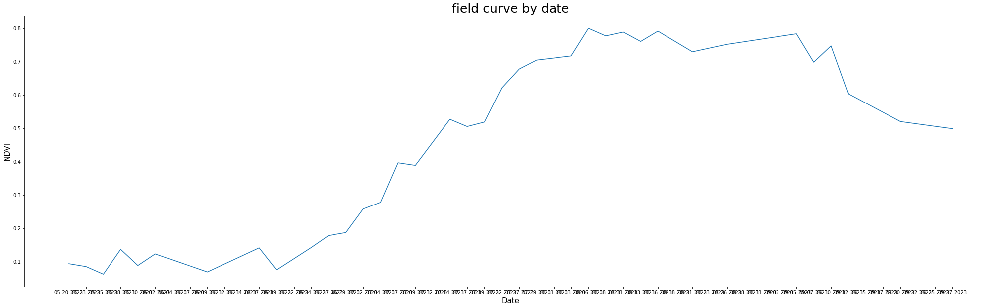

In [ ]:
province = 'Ravenna'
year = '2023'
id_n = '19_2023_Ravenna'

df_curve = df_tot[(df_tot['Province'] == province) & (df_tot['Year'] == year) & (df_tot['ID'] == id_n)]

fig, q = plt.subplots(figsize=(35, 10))
q = sns.lineplot(data=df_curve, x="Date", y="NDVI_ipotizzato") #Median_NDVI_per_pixel per la mediana e Mean_NDVI_per_pixel per la media
q.set_title("field curve by date", size=25)
q.set(xlabel='Date', ylabel='NDVI')
q.xaxis.label.set_size(15)
q.yaxis.label.set_size(15)

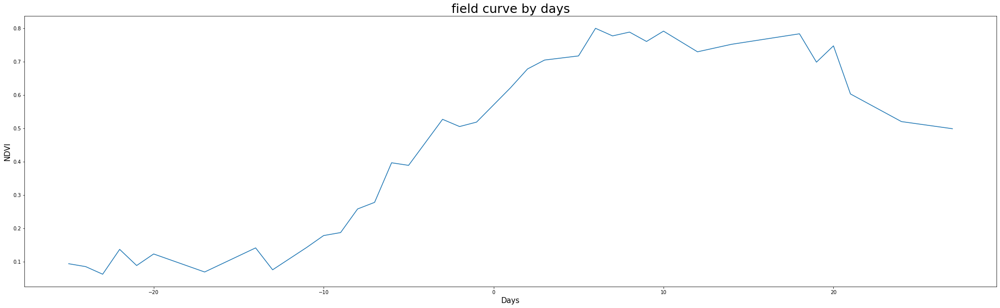

In [ ]:
province = 'Ravenna'
year = '2023'
id_n = '19_2023_Ravenna'

df_curve = df_tot[(df_tot['Province'] == province) & (df_tot['Year'] == year) & (df_tot['ID'] == id_n)]

fig, q = plt.subplots(figsize=(35, 10))
q = sns.lineplot(data=df_curve, x="Days", y="NDVI_ipotizzato") #Median_NDVI_per_pixel per la mediana e Mean_NDVI_per_pixel per la media
q.set_title("field curve by days", size=25)
q.set(xlabel='Days', ylabel='NDVI')
q.xaxis.label.set_size(15)
q.yaxis.label.set_size(15)

Graphs for every fields by days

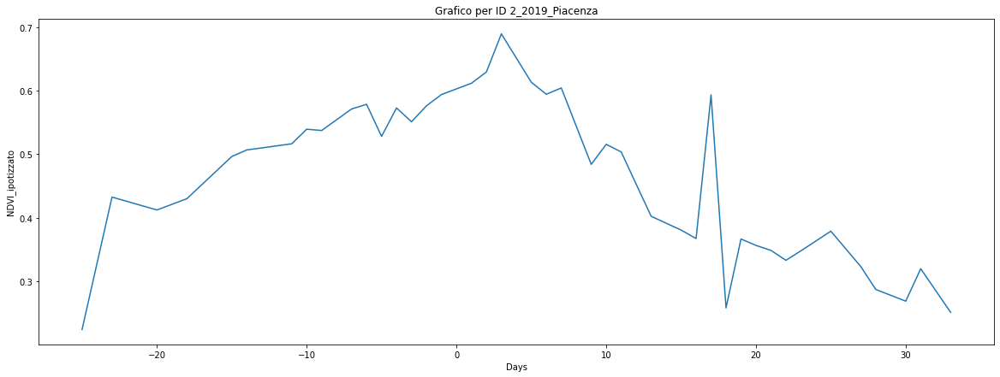

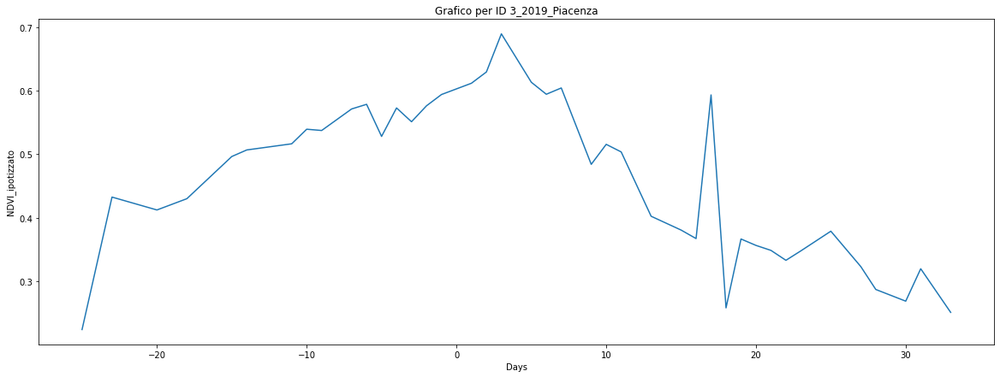

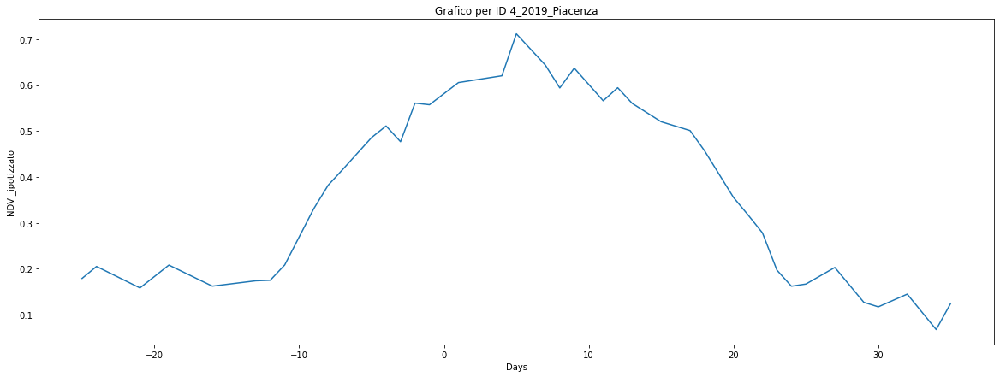

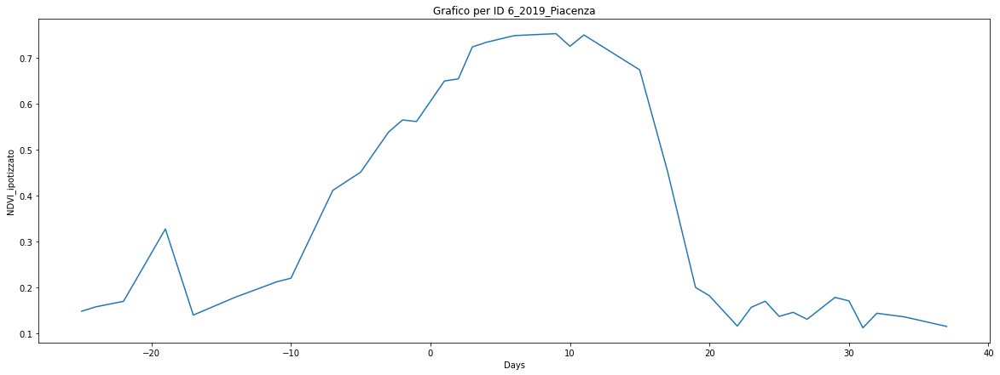

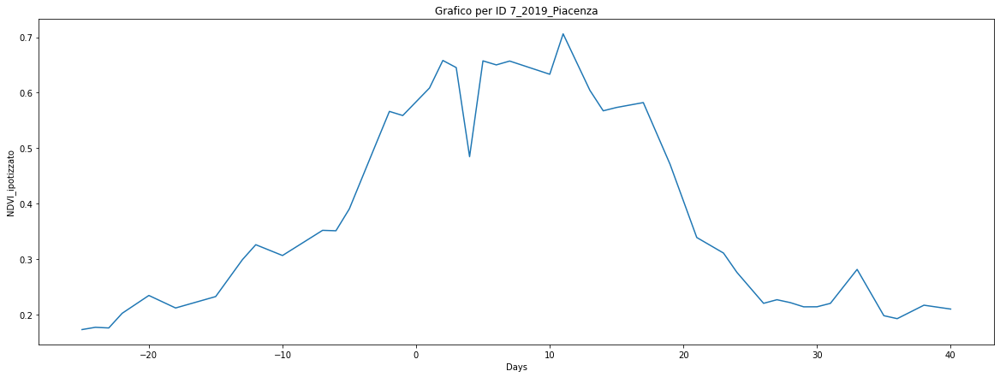

...

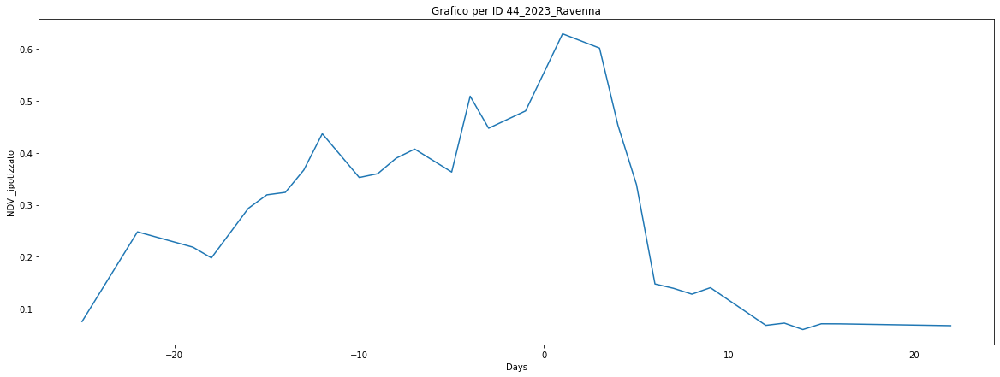

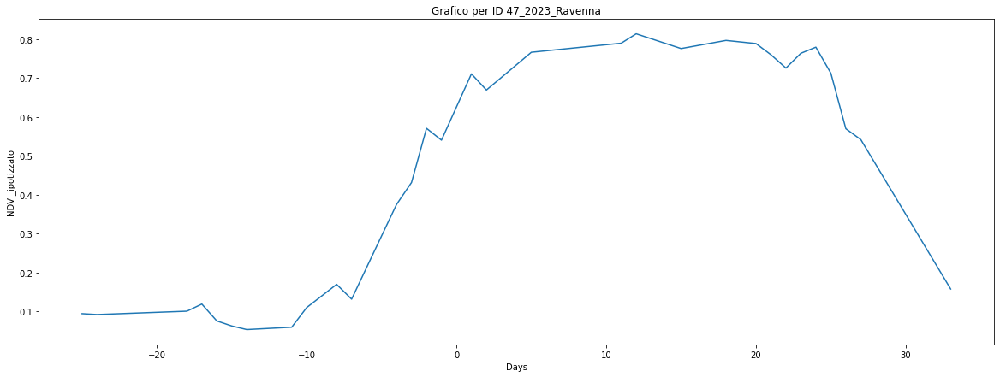

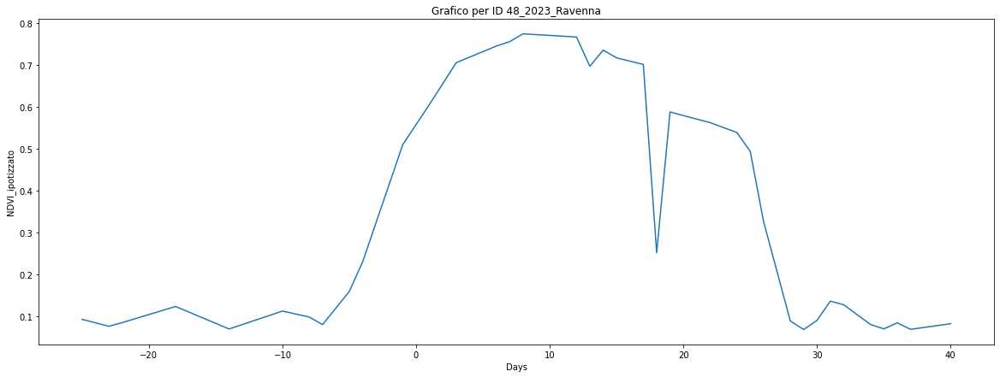

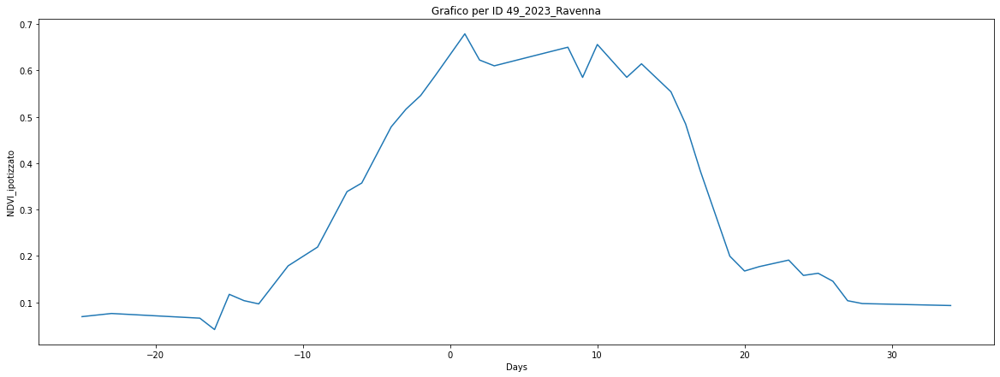

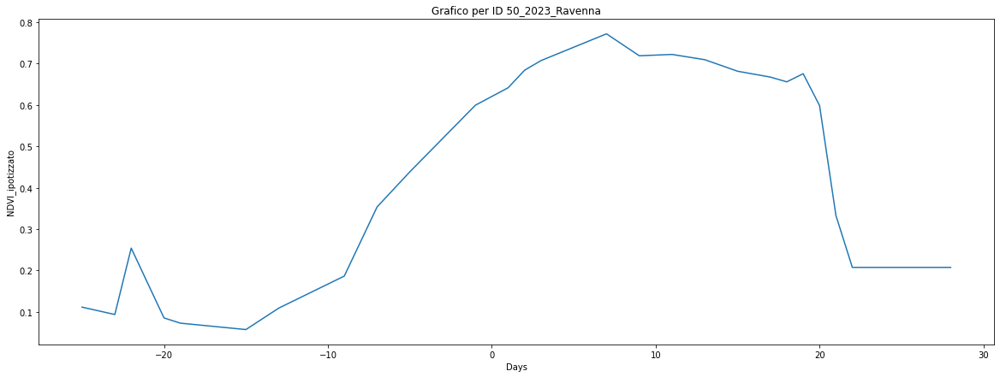

In [ ]:
df_tot = df_tot.sort_values(by=['Province', 'Year', 'Polygon_ID'])

# unique value of ID
id_values = df_tot['ID'].unique()

for id_value in id_values:
    # Selezionare solo le righe corrispondenti al valore ID corrente
    df_id = df_tot[df_tot['ID'] == id_value]

    # Tracciare il grafico solo se ci sono dati per questo ID
    if not df_id.empty:
        fig, ax = plt.subplots(figsize=(20, 7))  # Definire fig e ax con la dimensione specificata
        sns.lineplot(data=df_id, x="Days", y="NDVI_ipotizzato", ax=ax)  # Passare ax a sns.lineplot
        ax.set_title(f"Grafico per ID {id_value}")  # Usare ax per impostare il titolo
        plt.show()
    else:
        print(f"Nessun dato trovato per ID {id_value}")